<a href="https://colab.research.google.com/github/lblabucsd/Zada_Schulze_24/blob/main/dc_anatomy_selection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

#load packages
%matplotlib inline
import os
import csv
import numpy as np
import pandas as pd
import math
import time
import json
import matplotlib as mpl
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
!pip install pynrrd
import nrrd
import scipy
from scipy import io
from scipy.fftpack import rfft, irfft, fftfreq
import statsmodels
import seaborn as sns
from sklearn.decomposition import PCA, FastICA
from sklearn.cluster import KMeans, AgglomerativeClustering
import random
from random import randrange
#from random import shuffle
sns.set_style("white")
!pip install ipympl
from google.colab import output
output.enable_custom_widget_manager()
%matplotlib ipympl


def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def running_mean(x, N):
    return np.convolve(x, np.ones((N,))/N)[(N-1):]

def norm(inputs):
    output = (inputs-min(inputs))/(max(inputs)-min(inputs))
    return output

def baseline_subtraction(angle, window):
    new=[]
    for ndx,i in enumerate(angle):
        if ndx<window/2 or ndx>len(angle)-window/2:
            new.append(0)
        else:
            baseline=np.median(angle[ndx-int(window/2):ndx+int(window/2)])
            new.append(i-baseline)
    return new

def resized(data,N):
    M=data.size
    res=np.empty(N,data.dtype)
    carry=0
    m=0
    for n in range(N):
        sum=carry
        while m*N - n*M < M:
            sum += data[m]
            m += 1
        carry = (m-(n+1)*M/N)*data[m-1]
        sum -= carry
        res[n] = sum*N/M
    #res *= 1.0/res.max()
    return res


print('loaded')

In [ ]:
#For each fish, select location of each brain region
#you must manually identify each fish, anf select brain regions


#if a brain area is not present in zslice, select region and do not enter any points



to_do=['DZ-231225_f3_iso6_schooling','DZ-231225_f4_iso6_schooling','DZ-231225_f2_iso6_schooling','DZ-231225_f7_iso6_schooling']


brain_regions = ['dorsal_forebrain', 'ventral_forebrain', 'habenula','thalamus',\
                 'left_tectum_neuropil', 'left_tectum_cell-layer',\
                 'right_tectum_neuropil', 'right_tectum_cell-layer',\
                 'cerebellum', 'hindbrain']

f = 'DZ-231225_f5_iso6_schooling'
polygons = {}

print('in cell below, processing brain regions for fish ', f)

in cell below, processing brain regions for fish  DZ-230517_wk2_f2_schooling


click a polygon around the  habenula


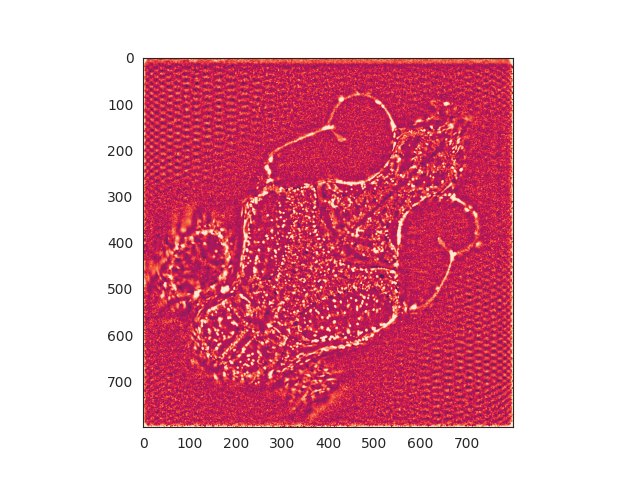

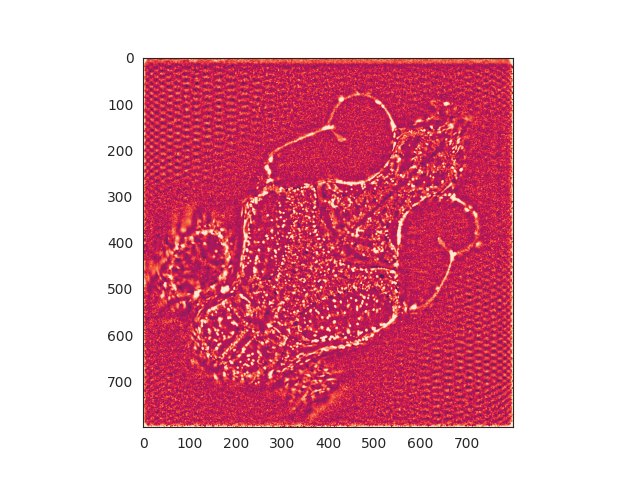

In [ ]:
#click around region when image is full size
#when done, change region name and do for next

region = 'dorsal_forebrain'
#region = 'ventral_forebrain'
#region = 'habenula'
#region = 'thalamus'
#region = 'left_tectum_neuropil'
#region = 'left_tectum_cell-layer'
#region = 'right_tectum_neuropil'
#region = 'right_tectum_cell-layer'
#region = 'cerebellum'
#region = 'hindbrain'


path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Schooling/'+f+'/'
output_ops =np.load(path+"suite2p/plane0/ops.npy", allow_pickle=True).item()

polygons[region]=[]

print("click a polygon around the ", region)

fig, ax = plt.subplots()
def onclick(event):
  ix, iy = event.xdata, event.ydata
  polygons[region].append((ix,iy))
ax.imshow(output_ops['meanImgE'])
fig.canvas.mpl_connect('button_press_event', onclick)
fig.show()

dorsal_forebrain
ventral_forebrain
habenula
thalamus
left_tectum_neuropil
left_tectum_cell-layer
right_tectum_neuropil
right_tectum_cell-layer
cerebellum
hindbrain


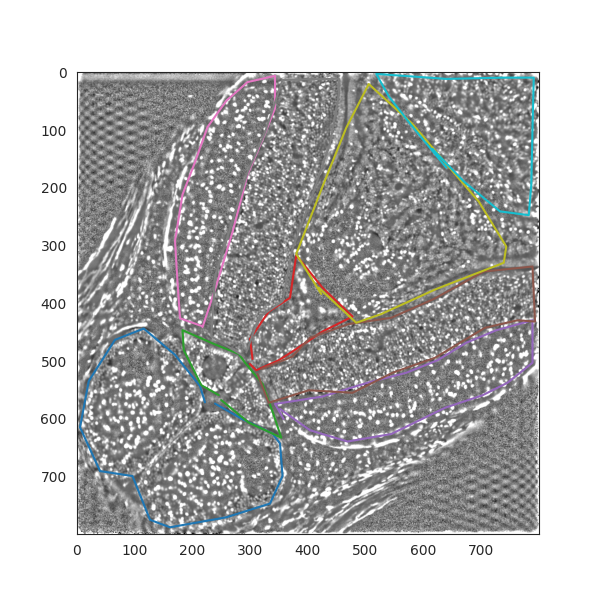

data saved for  DZ-230503_wk4_f1_schooling


In [ ]:
#check ROIs and save data
plt.figure(figsize=[6,6])
plt.imshow(output_ops['meanImgE'], cmap='gray')
for region, color in zip(brain_regions,['r','g','b','br','p','k','y','c','m','b']):
  print(region)
  plt.plot([i[0] for i in polygons[region]],[i[1] for i in polygons[region]])
plt.show()

np.savez(path+'region_polygons.npz', polygons, allow_pickle=True)

print('data saved for ', f)

3791 1605 3791
1511 1511


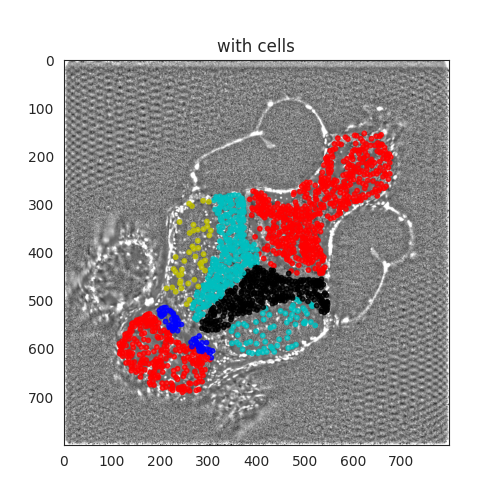

3570 1582 3570
2036 2036


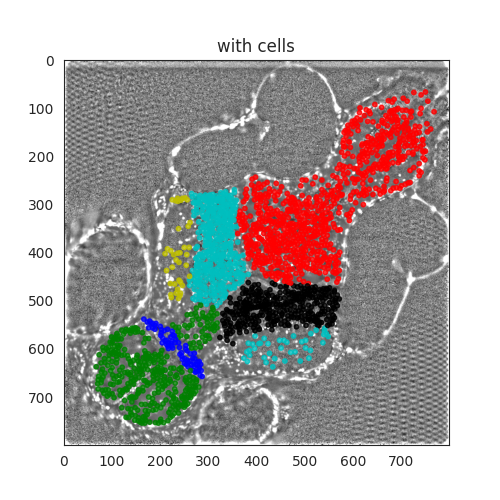

3491 1129 3491
1179 1179


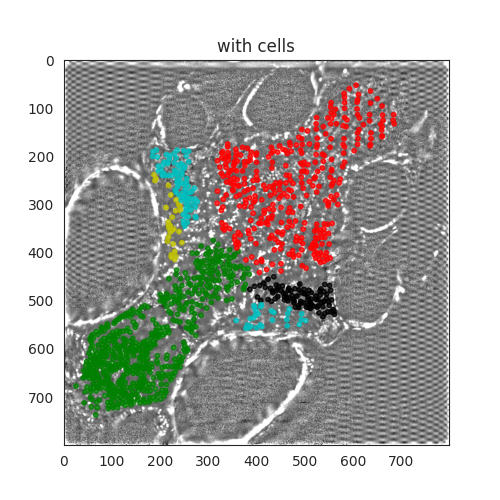

3535 775 3535
2577 2577


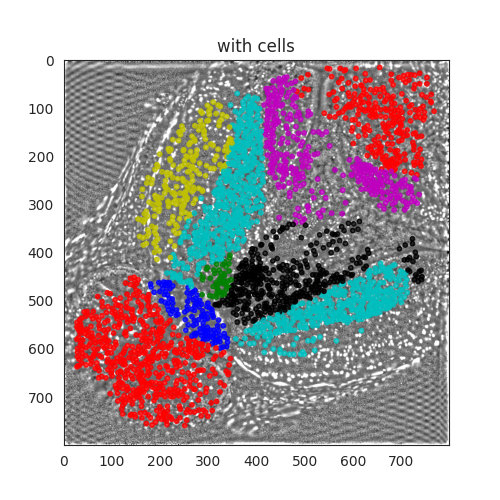

3670 688 3670
2781 2781


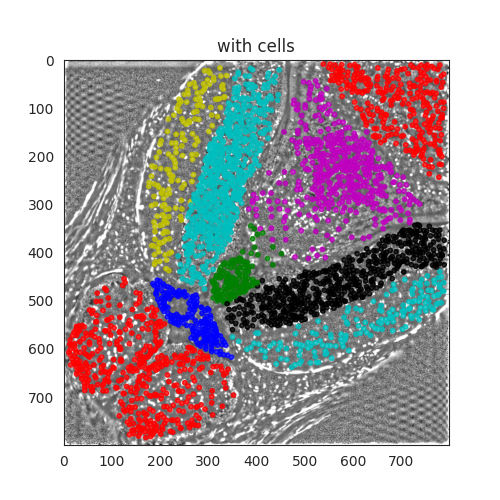

3532 1121 3532
2169 2169


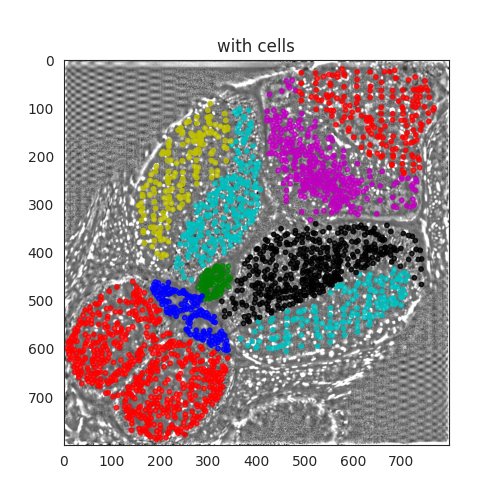

3691 1641 3691
2751 2751


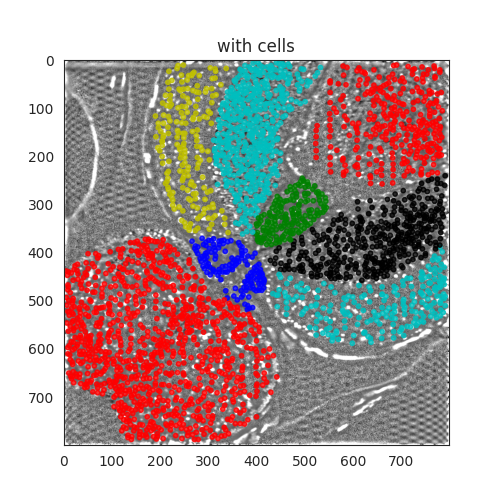

3687 1796 3687
2458 2458


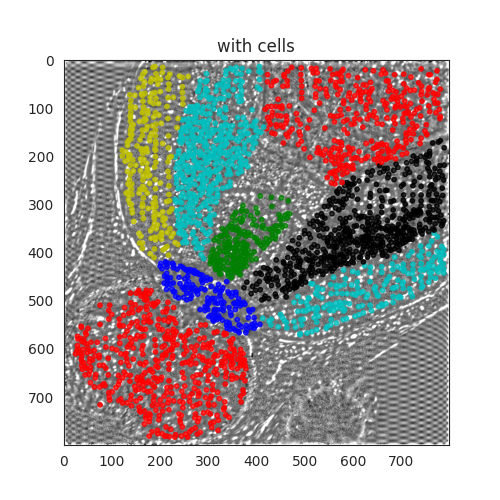

3656 1723 3656
2295 2295


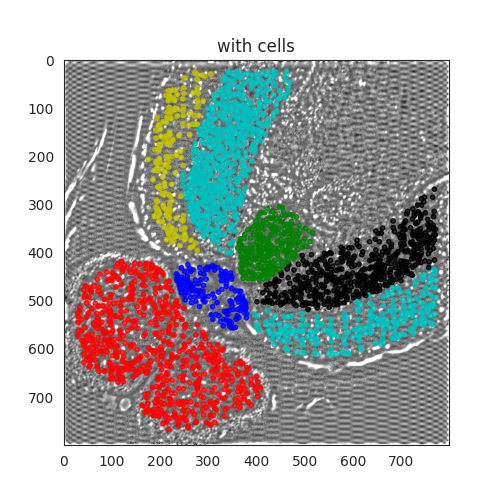

In [ ]:
#get rois in polygons and annotate neurons to save in this

import matplotlib.path as mplPath

subjects = ['DZ-230517_wk2_f2_schooling','DZ-230517_wk2_f2-2_schooling','DZ-230518_wk2_f1_z-170_schooling',\
        'DZ-230427_wk4_f1_schooling','DZ-230503_wk4_f1_schooling','DZ-230519_wk4_f1_schooling',\
        'DZ-230427_wk6_f1_schooling','DZ-230521_wk6_f2-2_schooling','DZ-230521_wk6_f3-2_schooling',\
        ]

brain_regions = ['dorsal_forebrain', 'ventral_forebrain', 'habenula','thalamus',\
                 'left_tectum_neuropil', 'left_tectum_cell-layer',\
                 'right_tectum_neuropil', 'right_tectum_cell-layer',\
                 'cerebellum', 'hindbrain']


for f in subjects:

  path = '/content/drive/MyDrive/Personal_notebooks/David_Notebook/2p_imaging/'+f[3:9]+'/'+f+'/'

  load = np.load(path+'region_polygons.npz', allow_pickle=True)
  polygons = load['arr_0'].item()

  neuron_coordinates=[]
  neuron_locations=[]

  iscell=np.load(path+"suite2p/plane0/iscell.npy",allow_pickle=True)
  stat=np.load(path+"suite2p/plane0/stat.npy",allow_pickle=True)
  output_ops =np.load(path+"suite2p/plane0/ops.npy", allow_pickle=True).item()

  for ndx,(i,s) in enumerate(zip(iscell,stat)):

      selected=0
      x = int(np.median(s['xpix']))
      y = int(np.median(s['ypix']))

      for region in brain_regions:
        if selected==0:
          if len(polygons[region])>2:
            polygons[region].append(polygons[region][0])
            poly = mplPath.Path(polygons[region])
            if poly.contains_point((x,y)):
              neuron_locations.append(region)
              neuron_coordinates.append([x,y])
              selected=1
      if selected==0:
        neuron_locations.append('none')
        neuron_coordinates.append([x,y])

  print(len(neuron_coordinates), int(sum([i[0] for i in iscell])), len(neuron_locations))

  np.savez(path+'anatomy_selections.npz', neuron_coordinates=neuron_coordinates, neuron_locations=neuron_locations)

  colorz=[]; col=['r','g','b','g','c','k','y','c','m','r'];
  neuron_x=[]; neuron_y=[];
  for reg,coords in zip(neuron_locations,neuron_coordinates):
    for ndx,region in enumerate(brain_regions):
      if region==reg:
        colorz.append(col[ndx])
        neuron_x.append(coords[0])
        neuron_y.append(coords[1])
  print(len(neuron_x), len(colorz))

  plt.figure(figsize=[5,5])
  plt.imshow(output_ops['meanImgE'], cmap='gray')
  plt.scatter(neuron_x, neuron_y, s=10, color=colorz, alpha=0.8)
  plt.title("with cells")
  plt.show()
